# Definición de funciones

In [117]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import preprocessing
from mpl_toolkits import mplot3d
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import OrdinalEncoder
from scipy.stats import shapiro
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import normaltest
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA 

In [4]:
# Semilla aletoria
np.random.seed(1)

In [5]:
#Generacion de dataset
def generate_dataset (observations_number, features_number, mean, std_dev, label):

  dummy_df = pd.DataFrame(np.random.normal(loc = mean, scale= std_dev, size=(observations_number, features_number)),columns=['feature {}'.format(i) for i in range(features_number)])
  dummy_df['Label'] = label
  return dummy_df

In [6]:
# Visualización de datos
def plot_observations(df):

  sns.pairplot(df, diag_kind='kde', hue='Label')
  plt.show()
  
  features_list = df.columns[0:df.shape[1]-1]

  if(len(features_list)==2):
    plt.scatter(df[features_list[0]], df[features_list[1]], c=np.asarray(df['Label']), cmap= 'RdYlBu')
    plt.show()

  if(len(features_list)==3):
    ax= plt.axes(projection ="3d")
    ax.scatter3D(df[features_list[0]], df[features_list[1]], df[features_list[2]], c=np.asarray(df['Label']))
    plt.show()
  

In [7]:
#Normalización 
def normalization(X):
  scaler = preprocessing.MinMaxScaler()
  scaler.fit(X)
  X = scaler.transform(X)
  return(X)
#Estandarización
def standarization(X):
  scaler = preprocessing.StandardScaler()
  scaler.fit(X)
  X = scaler.transform(X)
  return(X)

In [8]:
#Partición
def stratified_split(X,y, test_size, rnd_state=42):
  X_train, X_test, y_train, y_test = train_test_split(X,y, shuffle=True, test_size = test_size, stratify= y, random_state=rnd_state)
  return X_train, X_test, y_train, y_test

In [9]:
#Cálculo de métricas de clasificación
def get_classification_metrics(y_true, y_pred):
    accuracy = metrics.accuracy_score(y_true, y_pred)
    recall = metrics.recall_score(y_true, y_pred)
    especificity = metrics.recall_score(y_true, y_pred, pos_label=0)
    precision = metrics.precision_score(y_true, y_pred)
    npv = metrics.precision_score(y_true, y_pred, pos_label=0)
    f1 = 2*((precision*recall)/(precision+recall))
    auc = metrics.roc_auc_score(y_true, y_pred)

    dict = {'accuracy': accuracy, 'recall': recall, 'especificity': especificity, 'precision': precision, 'npv':npv, 'f1':f1, 'auc': auc}

    return dict

In [10]:
#Gráfico de la curva ROC y obtención del AUC
def plot_ROC(y_true, y_probs, color =  '#07D0DC'):
  fpr, tpr, thresholds = metrics.roc_curve(y_true, y_probs)
  auc = metrics.roc_auc_score(y_true, y_probs)
  ns_probs = [0 for _ in range(len(y_test))]
  plt.plot(fpr, tpr, marker='.', label='kNN (AUC = %0.2f)' %(auc), color = color)
  plt.plot(fpr, fpr, linestyle = '--', color = 'gray')
  plt.xlabel('Sensibilidad')
  plt.ylabel('1 - Especificidad')
  plt.legend(bbox_to_anchor=(1,1))


#Ejercicio 1
(Recordar el ej. 2.3). Supongamos que tenemos un dataset mezcla de dos grupos aleatorios bidimensionales (cada uno con 100 datos, su centroide y covariancia). Tip: reutilizar el código de la NB que vimos para outliers. Encontrar un clasificador por K-NN y evaluar exactitud, precisión, f-measure. Tomar inicialmente un dataset de entrenamiento de N=100 (50+50), k=10, y validar con el resto del dataset. Hacer algunos experimentos con otros N y k, y también cambiando centroide y covariancia de las clases. Optativo: Cambia mucho si el dataset tiene más dimensiones?

### Caso 1 - Distribuciones con media y desviación arbitraria, 10 vecinos, partición 50%

*   *train_set = 100*
*   *vecinos = 10*

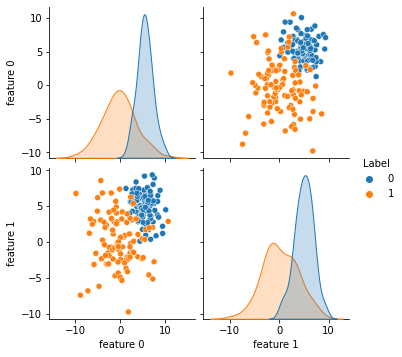

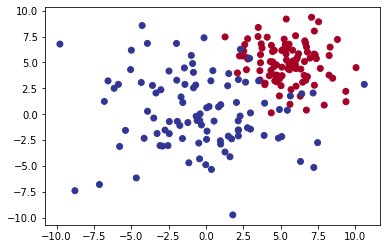

In [15]:
df_A = generate_dataset(100, 2, 5,2.0, 0)
df_B = generate_dataset(100, 2, 0,3.5, 1)
df = pd.concat([df_A, df_B], axis=0)
df.describe()
plot_observations(df)

In [16]:
#Separación atributos/target
X = np.asarray(df[df.columns[0:df.shape[1]-1]])
y = np.asarray(df[df.columns[-1:]])

X = standarization(X)

X_train, X_test, y_train, y_test = stratified_split(X,y,0.50)

accuracy 0.94
recall 0.92
especificity 0.96
precision 0.9583333333333334
npv 0.9230769230769231
f1 0.9387755102040817
auc 0.94


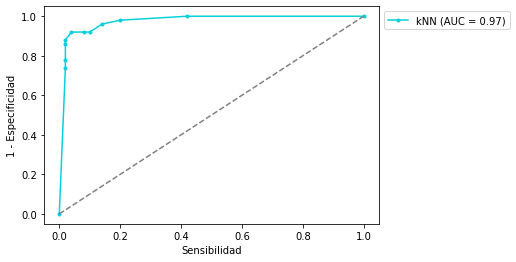

In [17]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

### Caso 2 - Mayor cantidad de muestras de entrenamiento
*   *train_set = 150*
*   *vecinos = 10*


In [18]:
#Separación atributos/target
X = np.asarray(df[df.columns[0:df.shape[1]-1]])
y = np.asarray(df[df.columns[-1:]])
X = standarization(X)

X_train, X_test, y_train, y_test = stratified_split(X,y,0.25)

accuracy 0.96
recall 0.96
especificity 0.96
precision 0.96
npv 0.96
f1 0.96
auc 0.96


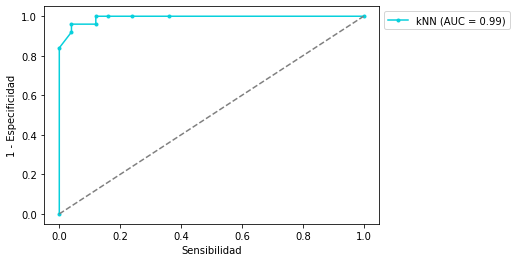

In [19]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*En este caso se observa una mejora en los resultados. Aumentar la cantidad de muestras de entrenamiento, le da al algoritmo más observaciones contra las cuales comparar un nuevo dato que se presente en test. Sin embargo, tener mayor cantidad de datos implica que con cada nueva observación, se deberán recomputar todas las distancias, generando mayor costo computacional*

### Caso 3 - Menor cantidad de muestras de entrenamiento
*   *train_set = 50*
*   *vecinos = 10*

In [20]:
#Separación atributos/target
X = np.asarray(df[df.columns[0:df.shape[1]-1]])
y = np.asarray(df[df.columns[-1:]])
X = standarization(X)

X_train, X_test, y_train, y_test = stratified_split(X,y,0.75)

accuracy 0.9
recall 0.8133333333333334
especificity 0.9866666666666667
precision 0.9838709677419355
npv 0.8409090909090909
f1 0.8905109489051095
auc 0.9000000000000001


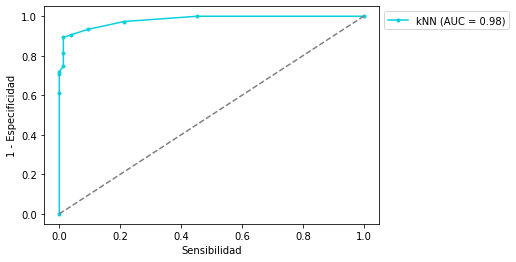

In [21]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*En este caso se observa una mejora en el AUC pero una ligera disminución en métricas como la sensibilidad y el f1 en relación al modelo base. Sin embargo, podemos destacar que el modelo presenta un elevado poder predictivo aún a pesar de emplear pocas observacoines para su ajuste.*

### Caso 4 - Mayor cantidad de vecinos cercanos
*   *train_set = 100*
*   *vecinos = 20*

In [22]:
#Separación atributos/target
X = np.asarray(df[df.columns[0:df.shape[1]-1]])
y = np.asarray(df[df.columns[-1:]])
X = standarization(X)

X_train, X_test, y_train, y_test = stratified_split(X,y,0.50)

accuracy 0.93
recall 0.88
especificity 0.98
precision 0.9777777777777777
npv 0.8909090909090909
f1 0.9263157894736842
auc 0.9299999999999999


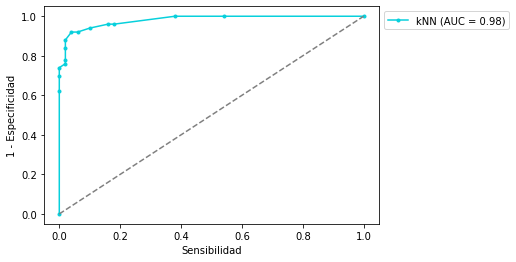

In [25]:
knn = KNeighborsClassifier(n_neighbors=20)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Respecto al modelo base con 10 vecinos, el incremento de los puntos considerados ha mejorado precisión, especificidad y AUC, mientras que las restantes se encuentran disminuidas*

### Caso 5 - Menor cantidad de vecinos cercanos
*   *train_set = 100*
*   *vecinos = 5*


accuracy 0.93
recall 0.94
especificity 0.92
precision 0.9215686274509803
npv 0.9387755102040817
f1 0.9306930693069307
auc 0.9299999999999999


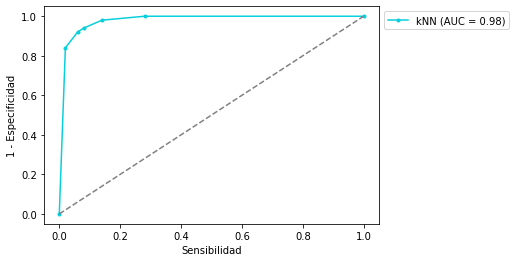

In [26]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*En este caso, la disminución de la cantidad de vecinos ha incrementado la sensibilidad y el valor predictivo negativo, con una disminución en consecuencia de las métricas restantes.*

### Caso 6 - Distribuciones más próximas, poca cantidad de vecinos, partición  50%
*   *train_set = 100*
*   *vecinos = 3*
*   *medias más próximas*


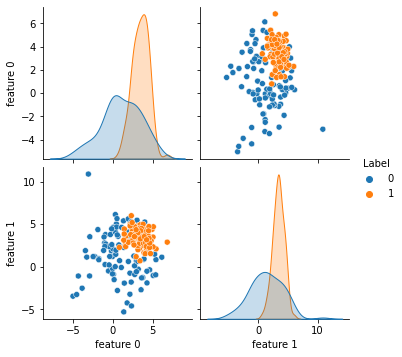

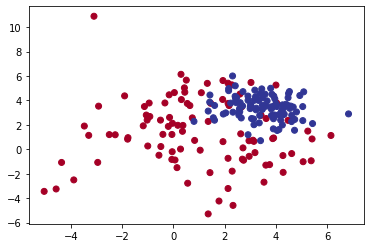

In [27]:
df_A = generate_dataset(100, 2, 1,2.5, 0)
df_B = generate_dataset(100, 2, 3.5,1, 1)
df = pd.concat([df_A, df_B], axis=0)
df.describe()
plot_observations(df)

In [28]:
#Separación atributos/target
X = np.asarray(df[df.columns[0:df.shape[1]-1]])
y = np.asarray(df[df.columns[-1:]])
X = standarization(X)

X_train, X_test, y_train, y_test = stratified_split(X,y,0.50)

accuracy 0.84
recall 0.78
especificity 0.9
precision 0.8863636363636364
npv 0.8035714285714286
f1 0.8297872340425532
auc 0.8400000000000001


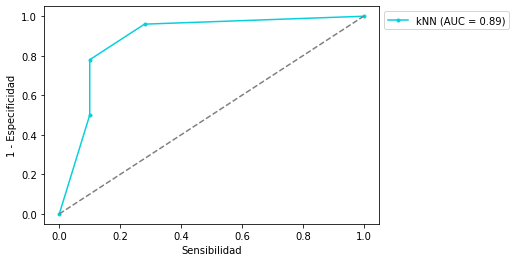

In [29]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Aproximar las medias vuelve a la tarea más compleja porque las observaciones se encuentran más próximas en el espacio de características. Así mismo, considerar poca cantidad de vecinos puede provocar que en  las regiones de mayor proximidad entre clases, una ligera diferencia en la cantidad de vecinos de una clase o de la otra de lugar a falsos positivos y falsos negativos*

### Caso 7 - Distribuciones más próximas, mayor cantidad de vecinos, partición 50%

*   *train_set = 100*
*   *vecinos = 21*
*   *medias más próximas*


accuracy 0.9
recall 0.98
especificity 0.82
precision 0.8448275862068966
npv 0.9761904761904762
f1 0.9074074074074074
auc 0.9000000000000001


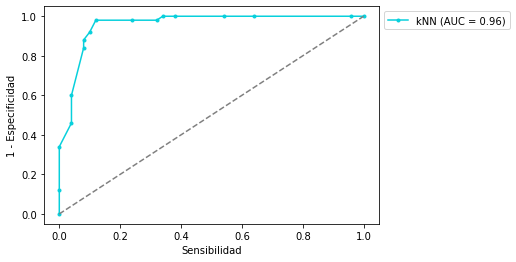

In [30]:
knn = KNeighborsClassifier(n_neighbors=21)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*En relación al caso anterior, el incremento en la cantidad de vecinos mejora considerablemente el desempeño del modelo, dado que la asignación del punto a la clase mayoritaria de vecinos cercanos dependerá de una cantidad mayor de observaciones.*

### Caso 8 - Distribuciones más alejadas, poca cantidad de vecinos, partición  50%
*   *train_set = 100*
*   *vecinos = 3*
*   *medias más alejadas y baja desviación estándar*


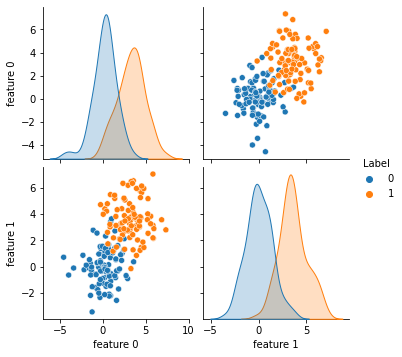

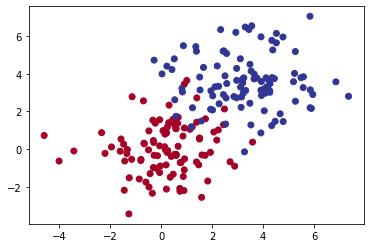

In [31]:
df_A = generate_dataset(100, 2, 0 , 1.5, 0)
df_B = generate_dataset(100, 2, 3.5, 1.5, 1)
df = pd.concat([df_A, df_B], axis=0)
df.describe()
plot_observations(df)

In [32]:
#Separación atributos/target
X = np.asarray(df[df.columns[0:df.shape[1]-1]])
y = np.asarray(df[df.columns[-1:]])
X = standarization(X)

X_train, X_test, y_train, y_test = stratified_split(X,y,0.50)

accuracy 0.95
recall 0.94
especificity 0.96
precision 0.9591836734693877
npv 0.9411764705882353
f1 0.9494949494949495
auc 0.95


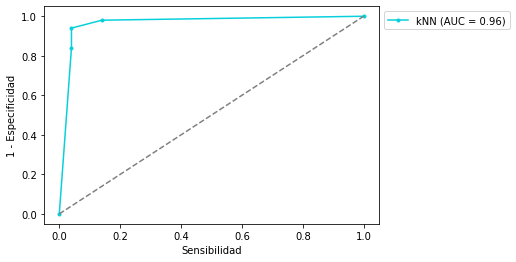

In [33]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Poseer distribuciones más alejadas simplifica la tarea de diferenciación entre clases. Aún con pocos vecinos como en este caso, se obtienen muy buenos resultados.*


### Caso 9 - Distribuciones más alejadas, mayor cantidad de vecinos, partición  50%
*   *train_set = 100*
*   *vecinos = 50*
*   *medias más alejadas y baja desviación estándar*


accuracy 0.93
recall 0.9
especificity 0.96
precision 0.9574468085106383
npv 0.9056603773584906
f1 0.9278350515463918
auc 0.9299999999999999


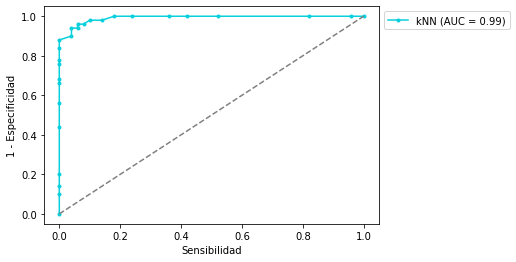

In [34]:
knn = KNeighborsClassifier(n_neighbors=50)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Cuando tenemos distribuciones muy separadas, lo cual simplifica la tarea, y además consideramos una mayor cantidad de vecinos, el modelo posee un desempeño prácticamente ideal.*




### Caso 10 - Aumento en las dimensiones (tres atributos)


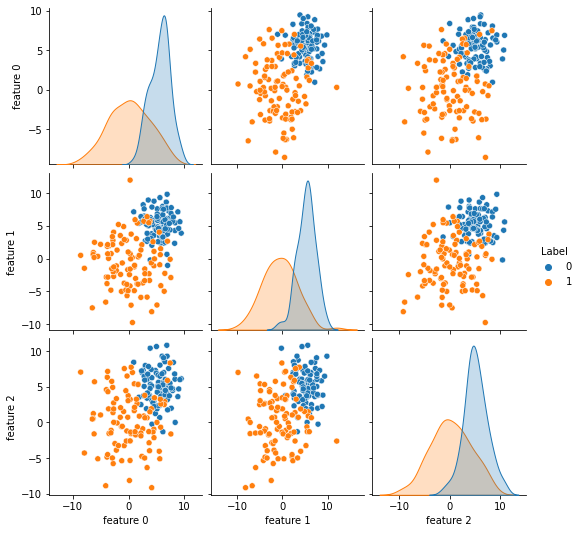

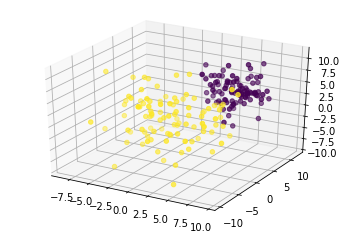

In [35]:
df_A = generate_dataset(100, 3, 5,2.0, 0)
df_B = generate_dataset(100, 3, 0,3.5, 1)
df = pd.concat([df_A, df_B], axis=0)
df.describe()
plot_observations(df)

In [36]:
#Separación atributos/target
X = np.asarray(df[df.columns[0:df.shape[1]-1]])
y = np.asarray(df[df.columns[-1:]])
X = standarization(X)

X_train, X_test, y_train, y_test = stratified_split(X,y,0.50)

accuracy 0.96
recall 0.92
especificity 1.0
precision 1.0
npv 0.9259259259259259
f1 0.9583333333333334
auc 0.96


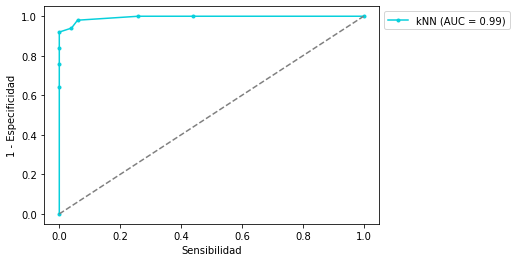

In [37]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Si el dataset tiene mayor cantidad de dimensiones, no existen cambios en términos de programar el ajuste del algoritmo. Cambiará el espacio de atributos, que en este caso con tres características se vuelve tridimensional (aún es graficable).*


### Caso 11 - Aumento en las dimensiones (diez atributos)


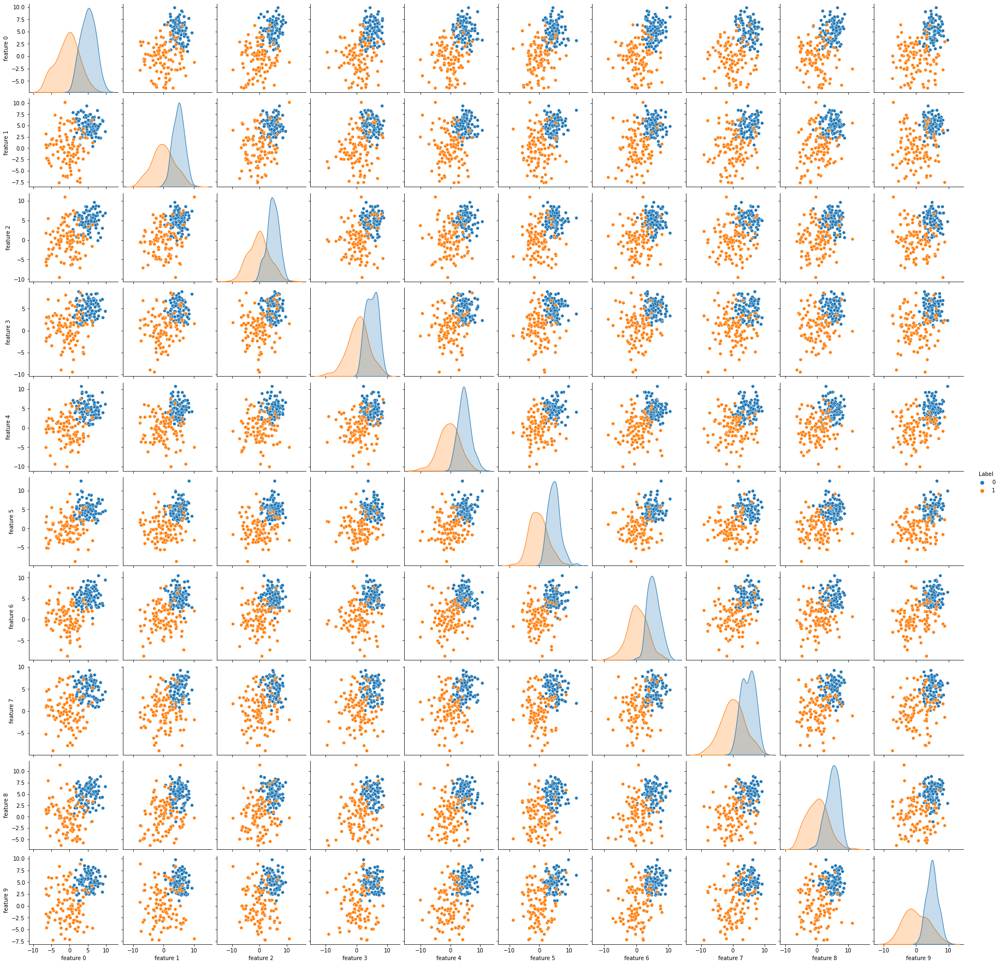

In [38]:
df_A = generate_dataset(100, 10, 5,2.0, 0)
df_B = generate_dataset(100, 10, 0,3.5, 1)
df = pd.concat([df_A, df_B], axis=0)
df.describe()
plot_observations(df)

In [39]:
#Separación atributos/target
X = np.asarray(df[df.columns[0:df.shape[1]-1]])
y = np.asarray(df[df.columns[-1:]])
X = standarization(X)

X_train, X_test, y_train, y_test = stratified_split(X,y,0.50)

accuracy 0.97
recall 0.94
especificity 1.0
precision 1.0
npv 0.9433962264150944
f1 0.9690721649484536
auc 0.97


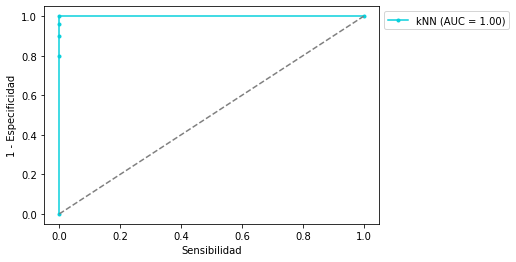

In [40]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train.ravel())

y_prob  = knn.predict_proba(X_test)[:, 1]
y_pred = knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Si el dataset tiene mayor cantidad de dimensiones, no existen cambios en términos de programar el ajuste del algoritmo. El costo computacional de realizar el ajuste será mayor en la medida en que aumenten las características como las observaciones disponibles. Cambiará el espacio de atributos, que en este caso con diez características no permite su visualización en un espacio de diez dimensiones.*


#Ejercicio 2

Hacer alguna experiencia con el dataset anterior utilizando validación cruzada y (o) grid search



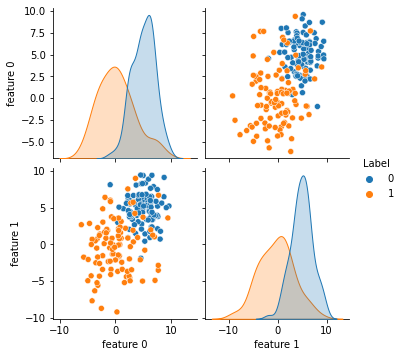

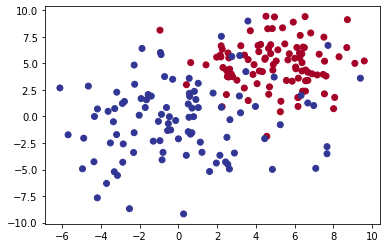

In [52]:
#Dataset

df_A = generate_dataset(100, 2, 5,2.0, 0)
df_B = generate_dataset(100, 2, 0,3.5, 1)
df = pd.concat([df_A, df_B], axis=0)
df.describe()
plot_observations(df)

In [53]:
#Separación atributos/target
X = np.asarray(df[df.columns[0:df.shape[1]-1]])
y = np.asarray(df[df.columns[-1:]])

X = standarization(X)

### Validación cruzada KFold


***** FOLD N° 1 *****

accuracy 0.875
recall 0.85
especificity 0.9
precision 0.8947368421052632
npv 0.8571428571428571
f1 0.8717948717948718
auc 0.875


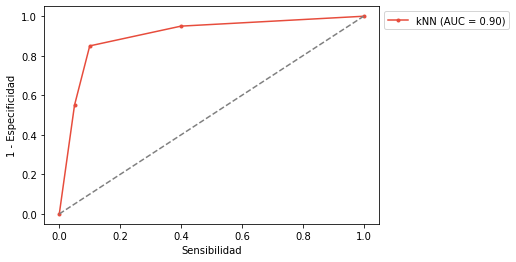


***** FOLD N° 2 *****

accuracy 0.875
recall 0.9
especificity 0.85
precision 0.8571428571428571
npv 0.8947368421052632
f1 0.8780487804878048
auc 0.875


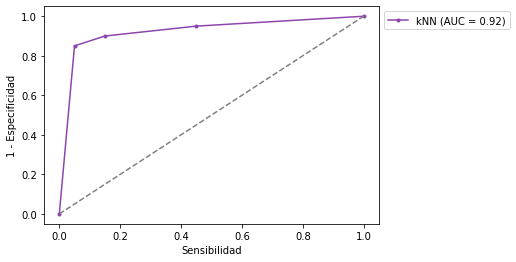


***** FOLD N° 3 *****

accuracy 0.925
recall 0.9
especificity 0.95
precision 0.9473684210526315
npv 0.9047619047619048
f1 0.9230769230769231
auc 0.9249999999999999


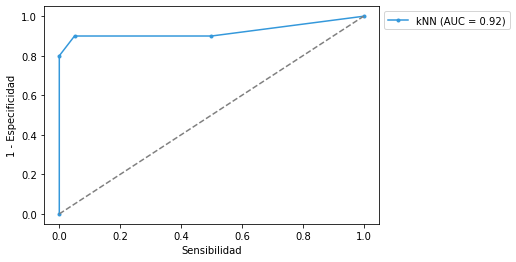


***** FOLD N° 4 *****

accuracy 0.875
recall 0.8
especificity 0.95
precision 0.9411764705882353
npv 0.8260869565217391
f1 0.8648648648648648
auc 0.875


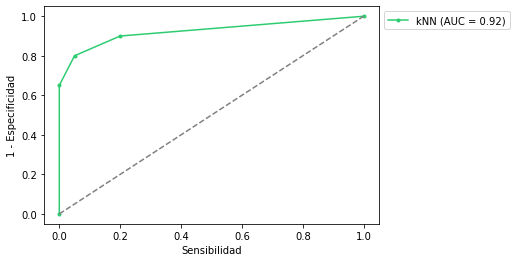


***** FOLD N° 5 *****

accuracy 0.95
recall 0.9
especificity 1.0
precision 1.0
npv 0.9090909090909091
f1 0.9473684210526316
auc 0.95


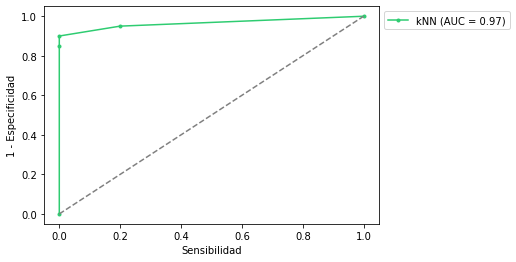

In [55]:
#Datos de cantidad de particiones
nro_splits = 5
n_fold = 1
ROC_colors = ['#E74C3C', '#8E44AD', '#3498DB', '#2ECC71', '#2ECC71']

skf = StratifiedKFold(n_splits=nro_splits, shuffle=True)

knn = KNeighborsClassifier(n_neighbors=3) 

#Datos de la partición
for train_index, test_index in skf.split(X,y): 
    
    X_train = X[train_index]
    y_train = y[train_index]
    X_test = X[test_index]
    y_test = y[test_index]
    
    knn.fit(X_train, y_train.ravel())

    y_prob  = knn.predict_proba(X_test)[:, 1]
    y_pred = knn.predict(X_test)

    metricas = get_classification_metrics(y_test, y_pred)
    print('\n***** FOLD N° %d *****\n' %(n_fold))
    for m in metricas:
      print(m, metricas[m])
      
    plot_ROC(y_test, y_prob, ROC_colors[n_fold-1])
    plt.show()
    n_fold += 1
 

### Grid Search

In [56]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [57]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Mejor puntuación: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'uniform'}
Mejor puntuación:  0.89375


accuracy 0.925
recall 0.9
especificity 0.95
precision 0.9473684210526315
npv 0.9047619047619048
f1 0.9230769230769231
auc 0.9249999999999999


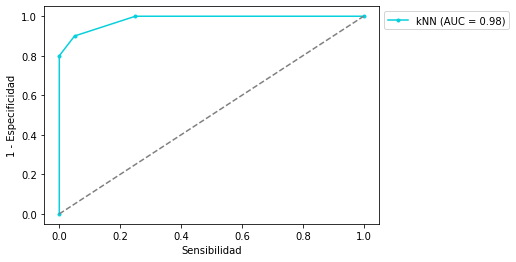

In [58]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

#Ejercicio 3

En el notebook https://github.com/manlio99/Materia-de-aprendizaje/blob/master/3_MidtermProjects/musica.ipynb
hay un dataset con 2000+ canciones de
Spotify de una usuaria, donde algunas
fueron marcadas como gustadas y otras
no. Cada canción tiene a su vez 16
atributos (nombre, artista, duración,
bailable, etc.). Desarrollar un clasificador
que prediga si una canción dada va a ser
gustada o no. Aclarar y justificar los
pasos, analizar y explicar los resultados


### Análisis exploratorio

In [11]:
df = pd.read_csv("https://raw.githubusercontent.com/emmanueliarussi/DataScienceCapstone/master/3_MidtermProjects/ProjectBOM/data/attributes_spotify.csv")
df.describe()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target
count,2017.000000,2017.000000,2017.000000,2.017000e+03,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000
mean,1008.000000,0.187590,0.618422,2.463062e+05,0.681577,0.133286,5.342588,0.190844,-7.085624,0.612295,0.092664,121.603272,3.968270,0.496815,0.505702
std,582.402066,0.259989,0.161029,8.198181e+04,0.210273,0.273162,3.648240,0.155453,3.761684,0.487347,0.089931,26.685604,0.255853,0.247195,0.500091
min,0.000000,0.000003,0.122000,1.604200e+04,0.014800,0.000000,0.000000,0.018800,-33.097000,0.000000,0.023100,47.859000,1.000000,0.034800,0.000000
25%,504.000000,0.009630,0.514000,2.000150e+05,0.563000,0.000000,2.000000,0.092300,-8.394000,0.000000,0.037500,100.189000,4.000000,0.295000,0.000000
50%,1008.000000,0.063300,0.631000,2.292610e+05,0.715000,0.000076,6.000000,0.127000,-6.248000,1.000000,0.054900,121.427000,4.000000,0.492000,1.000000
75%,1512.000000,0.265000,0.738000,2.703330e+05,0.846000,0.054000,9.000000,0.247000,-4.746000,1.000000,0.108000,137.849000,4.000000,0.691000,1.000000
max,2016.000000,0.995000,0.984000,1.004627e+06,0.998000,0.976000,11.000000,0.969000,-0.307000,1.000000,0.816000,219.331000,5.000000,0.992000,1.000000


In [12]:
df.head()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


##### Registros con alguna celda vacía

In [13]:
df.isnull().values.any()

False

##### Registros duplicados

In [14]:
df.shape

(2017, 17)

In [15]:
print(len(df['song_title'].unique()), df['song_title'].unique())
print(len(df['artist'].unique()), df['artist'].unique())

1956 ['Mask Off' 'Redbone' 'Xanny Family' ...
 'Habit - Dack Janiels & Wenzday Remix' 'First Contact'
 'I Wanna Get Better']
1343 ['Future' 'Childish Gambino' 'Beach House' ... 'Rain Man' 'Twin Moons'
 'Bleachers']


*Entre 2017 registros, hay 1956 nombres de canciones y 1343 nombres de artistas, por lo que buscamos la existencia de registros duplicados. Para estudiar ello, se elimina la primer columna que no corresponde a un atributo*

In [16]:
df = df[df.columns[1:]]
duplicate = df[df.duplicated()]
duplicate

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
267,0.096200,0.654,252095,0.292,0.003100,2,0.106,-12.977,1,0.4740,153.547,4.0,0.111,1,River,Ibeyi
508,0.024600,0.586,374133,0.806,0.000167,1,0.353,-9.542,1,0.0548,110.325,4.0,0.207,1,Her Fantasy,Matthew Dear
894,0.000334,0.907,183581,0.616,0.425000,6,0.110,-7.073,0,0.0577,124.036,4.0,0.614,1,Jack,Breach
927,0.934000,0.440,254360,0.433,0.811000,2,0.273,-17.453,0,0.0412,79.952,4.0,0.217,1,Episode I - Duel of The Fates,John Williams
981,0.036900,0.448,258653,0.733,0.042500,3,0.169,-6.238,1,0.0292,142.008,4.0,0.404,1,Myth,Beach House


*Se eliminan del set de datos los cinco registros duplicados.*

In [17]:
for i,v in enumerate(duplicate.index):
  df = df.drop(v)

print(df.shape)
print(df[df.duplicated()])

(2012, 16)
Empty DataFrame
Columns: [acousticness, danceability, duration_ms, energy, instrumentalness, key, liveness, loudness, mode, speechiness, tempo, time_signature, valence, target, song_title, artist]
Index: []


In [18]:
df.reset_index(drop=True, inplace=True)
df

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0.01020,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,0.19900,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,0.03440,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,0.60400,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,0.18000,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2007,0.00106,0.584,274404,0.932,0.002690,1,0.1290,-3.501,1,0.3330,74.976,4.0,0.211,0,Like A Bitch - Kill The Noise Remix,Kill The Noise
2008,0.08770,0.894,182182,0.892,0.001670,1,0.0528,-2.663,1,0.1310,110.041,4.0,0.867,0,Candy,Dillon Francis
2009,0.00857,0.637,207200,0.935,0.003990,0,0.2140,-2.467,1,0.1070,150.082,4.0,0.470,0,Habit - Dack Janiels & Wenzday Remix,Rain Man
2010,0.00164,0.557,185600,0.992,0.677000,1,0.0913,-2.735,1,0.1330,150.011,4.0,0.623,0,First Contact,Twin Moons


In [19]:
df['song_title'].value_counts()

Fuego                                          2
Annie                                          2
Sunshine Of Your Love                          2
Oblivion                                       2
Best Friend                                    2
                                              ..
Symphony                                       1
My Friend                                      1
Wildfire                                       1
Long Heels Red Bottoms                         1
You Know I'm No Good - Ghostface UK Version    1
Name: song_title, Length: 1956, dtype: int64

*Analizamos un primer caso de una canción repetida, esperando encontrar que es cantada por un artista distinto*

In [20]:
for i in range(len(df)):
  if(df['song_title'][i]=='Get Lucky'):
    print(df.loc[i])
    print('\n')

acousticness           0.0378
danceability             0.81
duration_ms            369627
energy                  0.793
instrumentalness     1.82e-06
key                         6
liveness                0.072
loudness               -9.404
mode                        0
speechiness            0.0403
tempo                 116.049
time_signature              4
valence                  0.86
target                      1
song_title          Get Lucky
artist              Daft Punk
Name: 961, dtype: object


acousticness           0.0378
danceability             0.81
duration_ms            369627
energy                  0.793
instrumentalness     1.82e-06
key                         6
liveness                0.072
loudness               -9.404
mode                        0
speechiness            0.0403
tempo                 116.049
time_signature              4
valence                  0.86
target                      0
song_title          Get Lucky
artist              Daft Punk
Name: 1210, d

*Hallamos que para una canción idéntica en todos sus atributos, el usuario ha indicado tanto que "le gusta" como que "no le gusta". Buscamos duplicados eliminando el target del dataset*

In [21]:
atributos = df.drop('target', axis=1)
duplicate_a = atributos[atributos.duplicated()]
duplicate_a

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,song_title,artist
1168,0.0102,0.833,204600,0.434,0.021900,2,0.165,-8.795,1,0.4310,150.062,4.0,0.286,Mask Off,Future
1210,0.0378,0.810,369627,0.793,0.000002,6,0.072,-9.404,0,0.0403,116.049,4.0,0.860,Get Lucky,Daft Punk
1221,0.1190,0.680,313787,0.489,0.000029,11,0.606,-7.837,0,0.4320,74.040,4.0,0.261,Swimming Pools (Drank) - Extended Version,Kendrick Lamar


*Encontramos que hay tres canciones idénticas para el cual el usuario ha seleccionado ambas opciones, por lo que procedemos a eliminar estos registros del conjunto de datos*

In [22]:
for i,v in enumerate(duplicate_a.index):
  df = df.drop(v)

print(df.shape)
print(df[df.duplicated()])

(2009, 16)
Empty DataFrame
Columns: [acousticness, danceability, duration_ms, energy, instrumentalness, key, liveness, loudness, mode, speechiness, tempo, time_signature, valence, target, song_title, artist]
Index: []


In [23]:
df.reset_index(drop=True, inplace=True)
df

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0.01020,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,0.19900,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,0.03440,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,0.60400,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,0.18000,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004,0.00106,0.584,274404,0.932,0.002690,1,0.1290,-3.501,1,0.3330,74.976,4.0,0.211,0,Like A Bitch - Kill The Noise Remix,Kill The Noise
2005,0.08770,0.894,182182,0.892,0.001670,1,0.0528,-2.663,1,0.1310,110.041,4.0,0.867,0,Candy,Dillon Francis
2006,0.00857,0.637,207200,0.935,0.003990,0,0.2140,-2.467,1,0.1070,150.082,4.0,0.470,0,Habit - Dack Janiels & Wenzday Remix,Rain Man
2007,0.00164,0.557,185600,0.992,0.677000,1,0.0913,-2.735,1,0.1330,150.011,4.0,0.623,0,First Contact,Twin Moons


*Se evalúan a continuación los casos en los que coincide nombre de canción y nombre de artista*

In [24]:
duplicate_title = df[df.duplicated('song_title')]
duplicate_artist = df[df.duplicated('artist')]

duplicate_title_index = duplicate_title.index.to_list()
duplicate_artist_index = duplicate_artist.index.to_list()

In [25]:
same_song_same_artist = []
for i,v in enumerate(duplicate_title_index):
  if(v in duplicate_artist_index):
    same_song_same_artist.append(v)

In [26]:
for i,v in enumerate(same_song_same_artist):
  song = df['song_title'][v]
  artist = df['artist'][v]
  taget = df['target'][v]

  df1 = df[(df.song_title == song) & (df.artist == artist)]
  if (df1.shape[0]>1):
    print(df1)

    acousticness  danceability  duration_ms  ...  target  song_title           artist
15         0.019         0.637       188333  ...       1        Char  Crystal Castles
27         0.018         0.646       188333  ...       1        Char  Crystal Castles

[2 rows x 16 columns]
    acousticness  danceability  duration_ms  ...  target     song_title  artist
67       0.00781         0.879       213786  ...       1  Look At Wrist  Father
92       0.00672         0.876       213246  ...       1  Look At Wrist  Father

[2 rows x 16 columns]
     acousticness  danceability  ...                            song_title    artist
55          0.120         0.532  ...  I Know There's Gonna Be (Good Times)  Jamie xx
115         0.119         0.564  ...  I Know There's Gonna Be (Good Times)  Jamie xx

[2 rows x 16 columns]
     acousticness  danceability  duration_ms  ...  target  song_title       artist
50         0.0185         0.740       241341  ...       1       Annie  Neon Indian
155        0

*Se estudia que en aquellos casos en donde coincide nombre de artista y nombre de canción, la diferencia no se encuentra en la variable target, sino que existe una variación en sus atributos, probablemente debido a distintas versiones de la misma canción, por ejemplo: versión unplugged, versión en vivo, etc. Aún si difiriera el target, no se eliminan del registro dado que a un usuario puede buscarle una versión y otra no.*

*Se analizan los casos para los cuales hay más de una canción por artista*

In [27]:
df['artist'].value_counts()

Drake              16
Rick Ross          13
Disclosure         12
Backstreet Boys    10
WALK THE MOON      10
                   ..
Shocking Blue       1
SWV                 1
The Hipwaders       1
Sísý Ey             1
Gareth Emery        1
Name: artist, Length: 1343, dtype: int64

*Dado que existen algunos artistas con más de 10 canciones seleccionadas, se convierte esta variable a una variable categórica numérica para estudiar si el usuario posee preferencias en base al artista. Por otro lado, se decide descartar del análisis la columna con el nombre de la canción.*

In [28]:
ord_enc = OrdinalEncoder()
df["artist"] = ord_enc.fit_transform(df[["artist"]])
df.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,449.0
1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,222.0
2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,449.0
3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,95.0
4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,628.0


In [29]:
df['artist'].value_counts()

356.0     16
960.0     13
345.0     12
1273.0    10
81.0      10
          ..
552.0      1
274.0      1
632.0      1
365.0      1
1067.0     1
Name: artist, Length: 1343, dtype: int64

In [30]:
df.drop('song_title', axis=1, inplace=True)

In [31]:
original_df = df

##### Separación atributos-target. Pairplot. Gráfico de barras.

In [32]:
X = df.drop('target', axis=1)
y = df['target']
Xy = pd.concat((X,y), axis=1)
Xy.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,artist,target
0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,449.0,1
1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,222.0,1
2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,449.0,1
3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,95.0,1
4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,628.0,1


In [33]:
print(X.shape)
X.head()

(2009, 14)


,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,artist
0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,449.0
1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,222.0
2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,449.0
3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,95.0
4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,628.0


In [34]:
print(y.shape)
y.head()

(2009,)


0    1
1    1
2    1
3    1
4    1
Name: target, dtype: int64

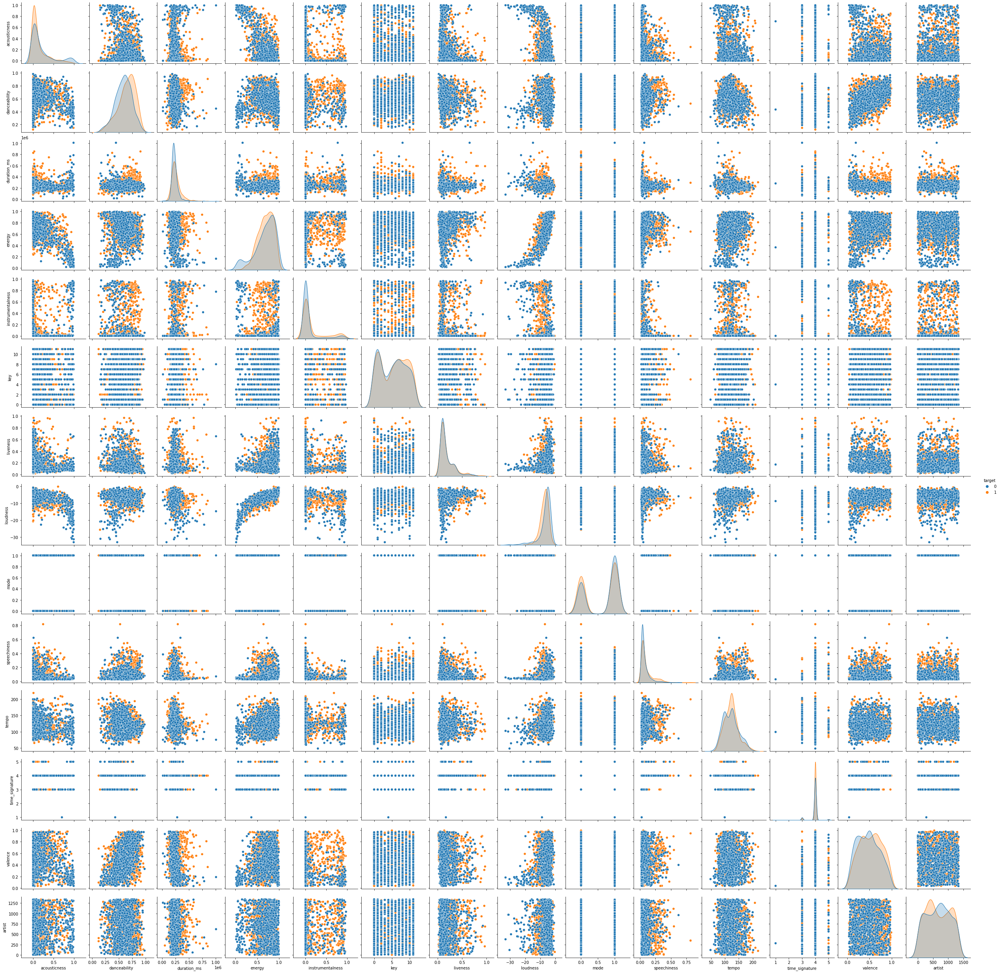

In [204]:
sns.pairplot(Xy, hue='target')

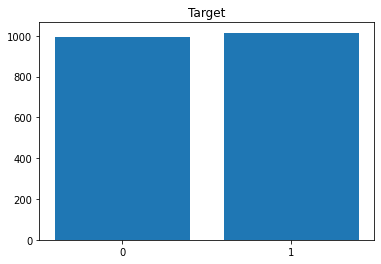

Hay 994 ceros y 1015 unos


In [206]:
target_cero = df['target'].to_list().count(0)
target_uno = df['target'].to_list().count(1)
values = [target_cero, target_uno]
targets = ['0','1']
plt.bar(targets,values)
plt.title('Target')
plt.show()

print('Hay %d ceros y %d unos' %(target_cero, target_uno))

##### Análisis de normalidad de los atributos

*Para sustentar lo observado en el pairplot, donde ningún atributo pareciera seguir una distribución normal, se procede a realizar el test de Shapiro-Wilk y los qqplots. En base a esto se definirá si los atributos son estandarizados (si siguen distirbución normal) o normalizados (si la distribución no es normal)*

stat=0.731, p=0.000
Según Shapiro, acousticness NO sigue una distribución normal


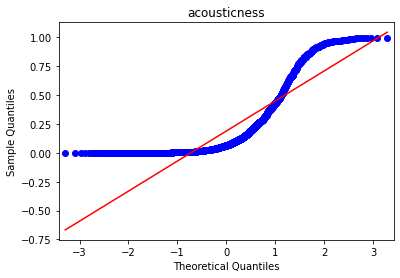

stat=0.985, p=0.000
Según Shapiro, danceability NO sigue una distribución normal


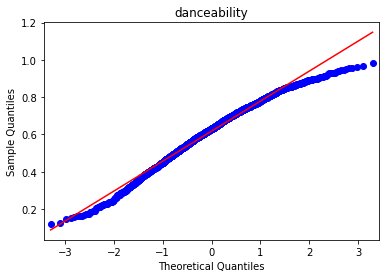

stat=0.814, p=0.000
Según Shapiro, duration_ms NO sigue una distribución normal


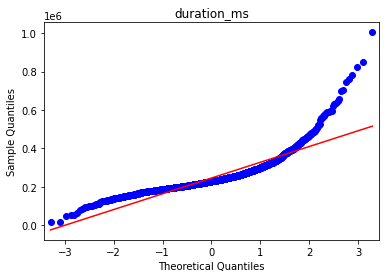

stat=0.937, p=0.000
Según Shapiro, energy NO sigue una distribución normal


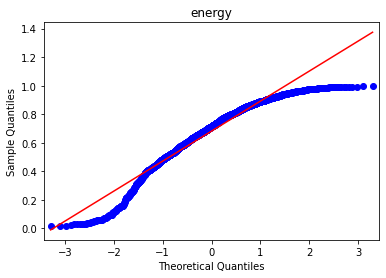

stat=0.543, p=0.000
Según Shapiro, instrumentalness NO sigue una distribución normal


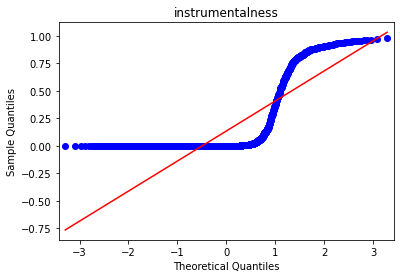

stat=0.920, p=0.000
Según Shapiro, key NO sigue una distribución normal


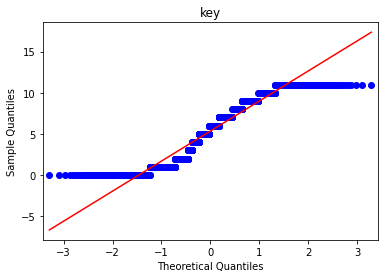

stat=0.776, p=0.000
Según Shapiro, liveness NO sigue una distribución normal


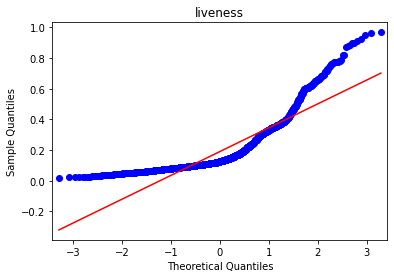

stat=0.827, p=0.000
Según Shapiro, loudness NO sigue una distribución normal


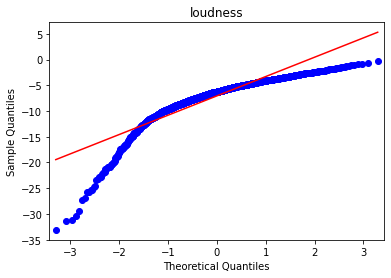

stat=0.618, p=0.000
Según Shapiro, mode NO sigue una distribución normal


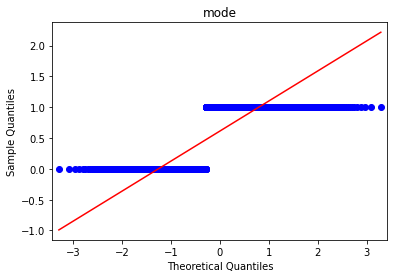

stat=0.702, p=0.000
Según Shapiro, speechiness NO sigue una distribución normal


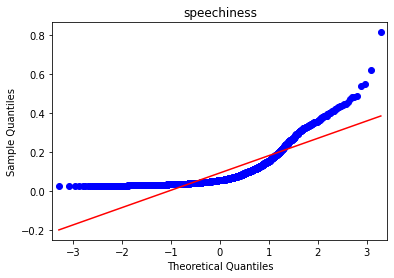

stat=0.984, p=0.000
Según Shapiro, tempo NO sigue una distribución normal


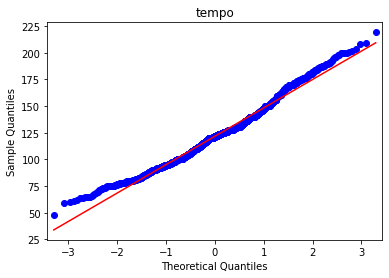

stat=0.304, p=0.000
Según Shapiro, time_signature NO sigue una distribución normal


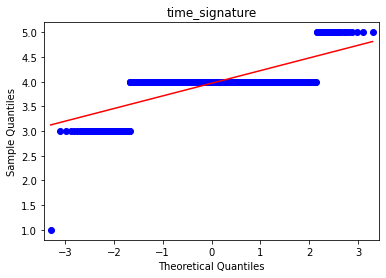

stat=0.972, p=0.000
Según Shapiro, valence NO sigue una distribución normal


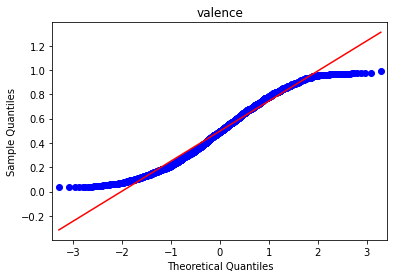

stat=0.956, p=0.000
Según Shapiro, artist NO sigue una distribución normal


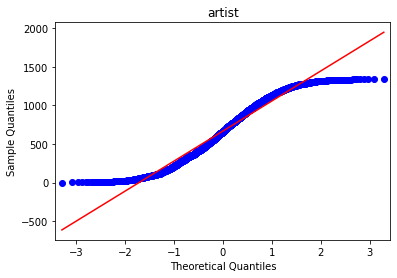

In [207]:
for i,v in enumerate(X):

  stat, p = shapiro(X[v])
  print('stat=%.3f, p=%.3f' % (stat, p))
  if p > 0.05:
      print("Según Shapiro, %s sigue una distribución normal" %(v))
  else:
      print("Según Shapiro, %s NO sigue una distribución normal" %(v))
  
  qqplot(X[v], line='s')
  plt.title(v)
  plt.show()

### Variables de partida para los modelos

*Antes de comenzar con los modelos, se crean nuevas variables que contienen los valores de los atributos, del target y del df tras el primer procesamiento realizado, en caso de que se requieran nuevamente*

In [35]:
X_final = X
y_final = y
df_final = df


### Caso 1: modelo base

*   Todos los atributos (sin normalizar ni estandarizar)
*   Todas las observaciones



In [213]:
X = np.asarray(X_final)
y = np.asarray(y_final)

In [216]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [217]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=12, p=2,
                     weights='uniform')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 12, 'weights': 'uniform'}
Best score:  0.5974071709138755


accuracy 0.5945273631840796
recall 0.4876847290640394
especificity 0.7035175879396985
precision 0.6265822784810127
npv 0.5737704918032787
f1 0.5484764542936288
auc 0.5956011585018689


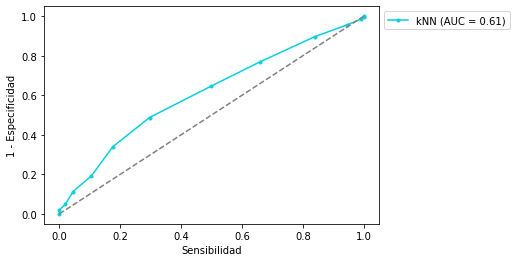

In [218]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Si bien el modelo se comporta mejor que al hacer una clasificación aleatoria, el desempeño pobre puede ser consecuencia de las diferencias en cuanto a escala de los atributos.*

### Caso 2: estandarización de las características

*   Todos los atributos estandarizados
*   Todas las observaciones


*A pesar de conocer que las distribuciones de los atributos no se aproximan a una normal, se realizará un experimento estandarizando las mismas para ver el impacto en el desempeño del clasificador.*

In [219]:
X = standarization(X_final)
y= np.asarray(y_final)

In [220]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [221]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                     weights='distance')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'distance'}
Best score:  0.7100152860819258


accuracy 0.7661691542288557
recall 0.6896551724137931
especificity 0.8442211055276382
precision 0.8187134502923976
npv 0.7272727272727273
f1 0.7486631016042781
auc 0.7669381389707156


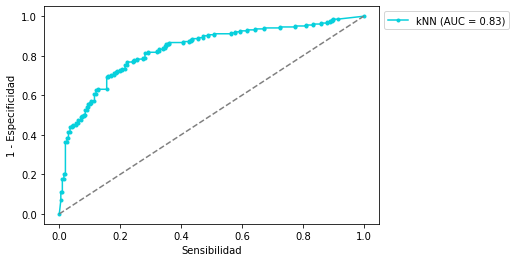

In [222]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*La estandarización de los parámetros mejora considerablemente el desempeño del modelo.*

### Caso 3: normalización de las características

*   Todos los atributos normalizados
*   Todas las observaciones


In [224]:
X = normalization(X_final)
y= np.asarray(y_final)

In [225]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [226]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                     weights='distance')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'distance'}
Best score:  0.6813974187805963


accuracy 0.753731343283582
recall 0.6798029556650246
especificity 0.8291457286432161
precision 0.8023255813953488
npv 0.717391304347826
f1 0.736
auc 0.7544743421541202


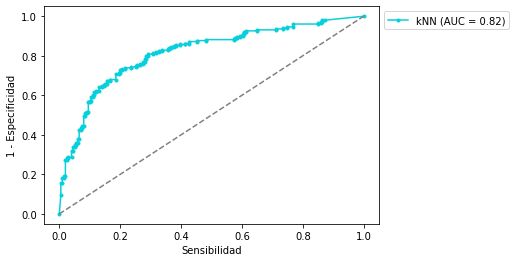

In [227]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*La normalización de los parámetros mejora considerablemente el desempeño del modelo base. Si bien éste es ligeramente inferior al caso de la estandarización, en los siguientes experimentos normalizaremos los atributos dado que sus distribuciones no son normales.*

### Caso 4: detección de outliers y normalización

*   Eliminación de registros outliers en base a cada atributo
*   Todos los atributos normalizados



In [36]:
X = X_final
y = y_final
Xy = pd.concat((X,y), axis=1)

*Empleamos el algoritmo DBSCAN para detectar outliers de manera multivariaday no paramétrica .*

In [37]:
# Cuando se trabaja con problemas de agrupación en clústeres, escalar los datos es crucial
Xy_scaled = StandardScaler().fit_transform(Xy.values)

# ajustar
db = DBSCAN(eps=3.0, min_samples=10).fit(Xy_scaled)
labels = db.labels_
labels

array([0, 0, 0, ..., 0, 0, 0])

In [38]:
Xy.columns

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence', 'artist',
       'target'],
      dtype='object')

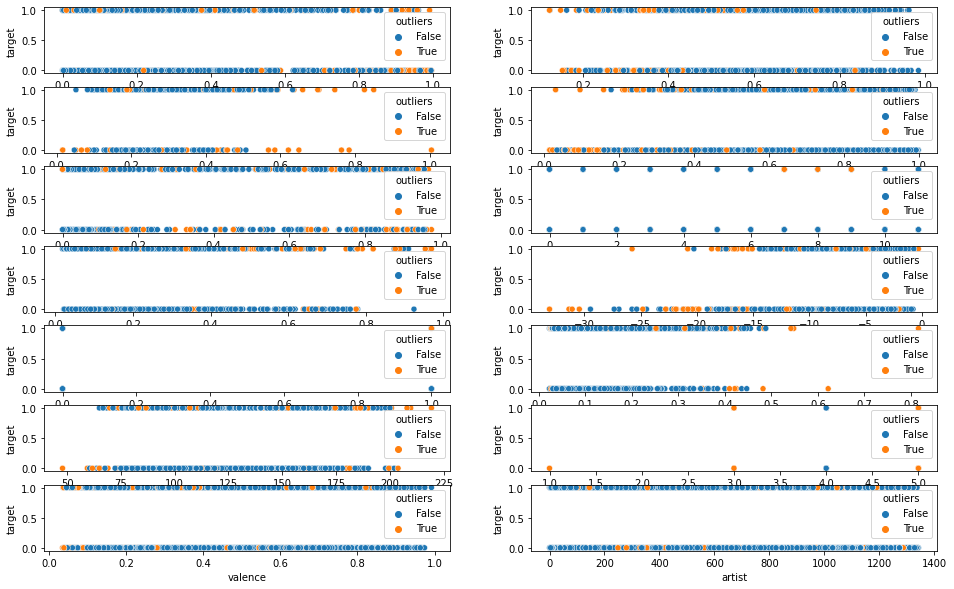

In [39]:
plt.figure(figsize=(16,10))
Xy_outlier = Xy
Xy_outlier['outliers'] = [True if l == -1 else False for l in labels]

ax1=plt.subplot(7, 2, 1)
sns.scatterplot(x="acousticness", y="target", hue='outliers', data=Xy_outlier,ax=ax1)
ax2=plt.subplot(7, 2, 2)
sns.scatterplot(x="danceability", y="target", hue='outliers', data=Xy_outlier,ax=ax2)
ax3=plt.subplot(7, 2, 3)
sns.scatterplot(x="duration_ms", y="target", hue='outliers', data=Xy_outlier,ax=ax3)
ax4=plt.subplot(7, 2, 4)
sns.scatterplot(x="energy", y="target", hue='outliers', data=Xy_outlier,ax=ax4)
ax5=plt.subplot(7, 2, 5)
sns.scatterplot(x="instrumentalness", y="target", hue='outliers', data=Xy_outlier,ax=ax5)
ax6=plt.subplot(7, 2, 6)
sns.scatterplot(x="key", y="target", hue='outliers', data=Xy_outlier,ax=ax6)
ax7=plt.subplot(7, 2, 7)
sns.scatterplot(x="liveness", y="target", hue='outliers', data=Xy_outlier,ax=ax7)
ax8=plt.subplot(7, 2, 8)
sns.scatterplot(x="loudness", y="target", hue='outliers', data=Xy_outlier,ax=ax8)
ax9=plt.subplot(7, 2, 9)
sns.scatterplot(x="mode", y="target", hue='outliers', data=Xy_outlier,ax=ax9)
ax10=plt.subplot(7, 2, 10)
sns.scatterplot(x="speechiness", y="target", hue='outliers', data=Xy_outlier,ax=ax10)
ax11=plt.subplot(7, 2, 11)
sns.scatterplot(x="tempo", y="target", hue='outliers', data=Xy_outlier,ax=ax11)
ax12=plt.subplot(7, 2, 12)
sns.scatterplot(x="time_signature", y="target", hue='outliers', data=Xy_outlier,ax=ax12)
ax13=plt.subplot(7, 2, 13)
sns.scatterplot(x="valence", y="target", hue='outliers', data=Xy_outlier,ax=ax13)
ax14=plt.subplot(7, 2, 14)
sns.scatterplot(x="artist", y="target", hue='outliers', data=Xy_outlier,ax=ax14)


In [40]:
Xy_outlier = Xy_outlier[Xy_outlier['outliers'] == False]
len(Xy_outlier)

1816

In [41]:
Xy_outlier

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,artist,target,outliers
0,0.01020,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,449.0,1,False
1,0.19900,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,222.0,1,False
2,0.03440,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,449.0,1,False
3,0.60400,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,95.0,1,False
5,0.00479,0.804,251333,0.560,0.000000,8,0.1640,-6.682,1,0.1850,85.023,4.0,0.264,356.0,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004,0.00106,0.584,274404,0.932,0.002690,1,0.1290,-3.501,1,0.3330,74.976,4.0,0.211,662.0,0,False
2005,0.08770,0.894,182182,0.892,0.001670,1,0.0528,-2.663,1,0.1310,110.041,4.0,0.867,335.0,0,False
2006,0.00857,0.637,207200,0.935,0.003990,0,0.2140,-2.467,1,0.1070,150.082,4.0,0.470,947.0,0,False
2007,0.00164,0.557,185600,0.992,0.677000,1,0.0913,-2.735,1,0.1330,150.011,4.0,0.623,1242.0,0,False


In [42]:
Xy_outlier = Xy_outlier[Xy_outlier.columns[:-1]]
X_outlier = Xy_outlier[Xy_outlier.columns[:-1]]
y_outlier = Xy_outlier[Xy_outlier.columns[-1:]]

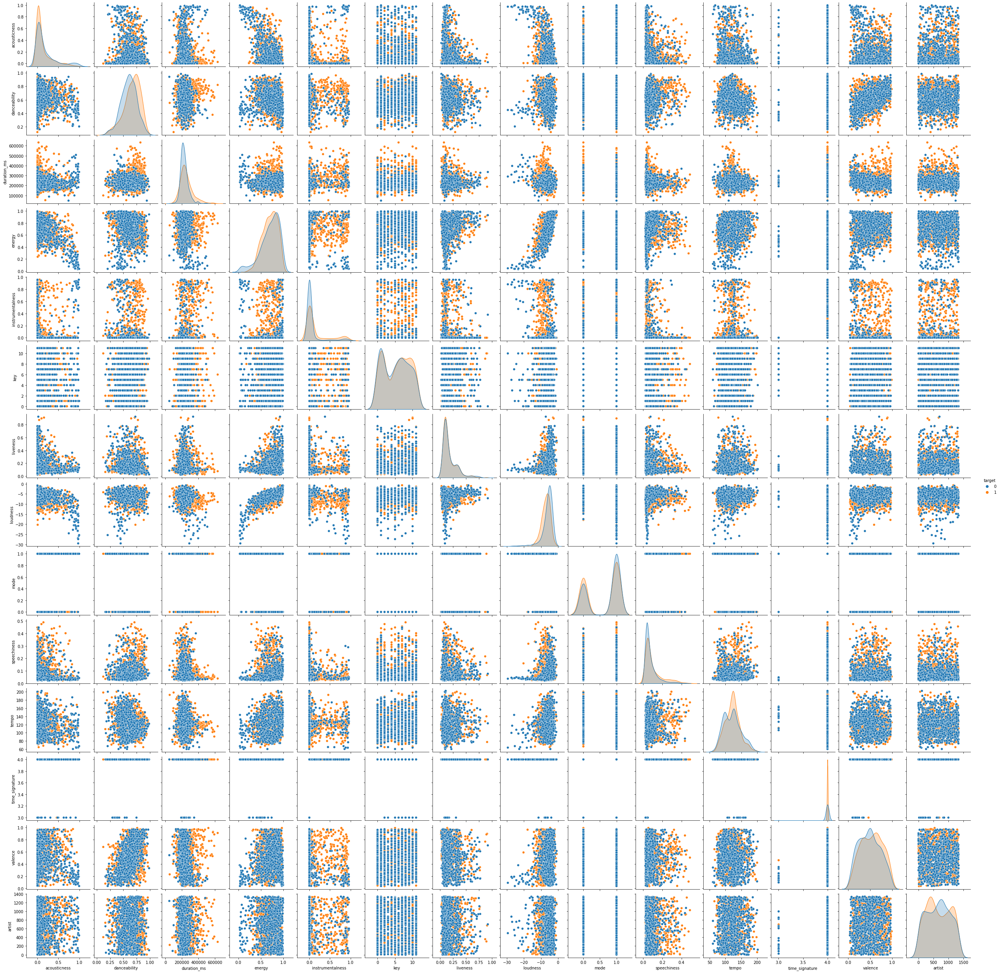

In [255]:
sns.pairplot(Xy_outlier, hue='target')

In [ ]:
X_outlier = normalization(X_outlier)
y_outlier = np.asarray(y_outlier)

In [43]:
#Almacenamos en nueva variable para mantener la información para próximos experimentos
X_outlier_final = pd.DataFrame(X_outlier)
X_outlier_final.columns = Xy.columns[:-2]

y_outlier_final = pd.DataFrame(y_outlier)
y_outlier_final.columns = ['target']

Xy_outlier_final = pd.concat((X_outlier_final, y_outlier_final), axis=1)

In [271]:
X_train, X_test, y_train, y_test = stratified_split(X_outlier,y_outlier,0.20)

In [272]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=23, p=2,
                     weights='distance')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 23, 'weights': 'distance'}
Best score:  0.7162673302523995


accuracy 0.6538461538461539
recall 0.47540983606557374
especificity 0.8342541436464088
precision 0.7435897435897436
npv 0.611336032388664
f1 0.5800000000000001
auc 0.6548319898559912


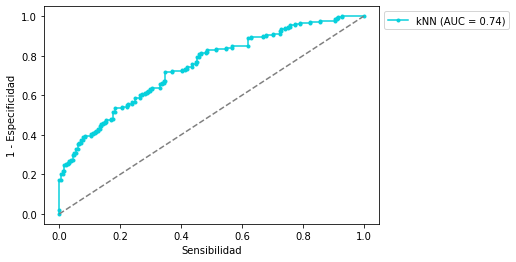

In [273]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*La eliminación de outliers, seguida de un proceso de normalización, provocó una disminución en el desempeño del algoritmo, por lo que en los próximos experimentos se utilizarán todos los registros que quedaron tras el análisis inicial y la eliminación de registros idénticos o incongruentes.*

### Caso 5: normalización y selección de caractertísticas

*   Todas las observaciones
*   Atributos normalizados
*   Atributos seleccionados mediante distintos métodos y criterios

In [51]:
X_final_norm = pd.DataFrame(normalization(X_final))
X_final_norm.columns = X_final.columns
y_final_norm = y_final
y_final_norm.columns = ['target']
Xy_final_norm = pd.concat((X_final_norm, y_final), axis=1)

#### Caso 5A: Feature Importance

##### Caso 5A-I: Umbral 0.09

In [52]:
# load data
a = Xy_final_norm.values
X = a[:,:-1]
y = a[:,-1:]
# feature extraction
model = ExtraTreesClassifier(n_estimators=10)
model.fit(X, y)
importance = model.feature_importances_
print(importance)

[0.08277521 0.08200354 0.08306297 0.08853872 0.10840803 0.05892186
 0.06011737 0.1059901  0.01929724 0.0893796  0.06856241 0.01408589
 0.07500579 0.06385127]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


In [53]:
selected_features = []
for i in range(len(Xy_final_norm.columns)-1):
  print(Xy_final_norm.columns[i], importance[i])
  if(importance[i]>=0.09):
    selected_features.append(Xy_final_norm.columns[i])

selected_features

acousticness 0.0827752103594632
danceability 0.0820035438333552
duration_ms 0.08306296620125322
energy 0.08853872356698815
instrumentalness 0.10840802613566794
key 0.058921863088478535
liveness 0.06011737381100644
loudness 0.10599009673674926
mode 0.019297242289906404
speechiness 0.0893795973374009
tempo 0.06856241298771434
time_signature 0.014085893005880108
valence 0.07500578556152433
artist 0.06385126508461195


['instrumentalness', 'loudness']

In [54]:
X = np.asarray(Xy_final_norm[selected_features])
y = np.asarray(Xy_final_norm['target'])

In [55]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [56]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=None, n_neighbors=20, p=2,
                     weights='uniform')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'euclidean', 'n_neighbors': 20, 'weights': 'uniform'}
Best score:  0.6459066194539579


accuracy 0.6865671641791045
recall 0.625615763546798
especificity 0.7487437185929648
precision 0.7175141242937854
npv 0.6622222222222223
f1 0.6684210526315789
auc 0.6871797410698814


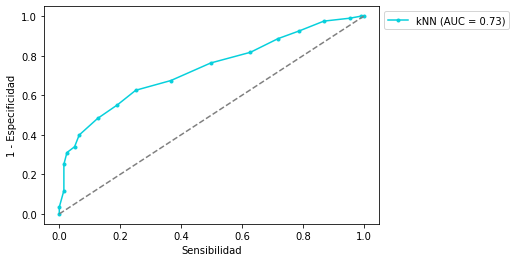

In [57]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*En este caso, el desempeño del algoritmo empleando dos características normalizadas y todo el dataset, es inferior al caso en el que se utilizaron todos los atributos normalizados, no justificando ello la reducción de dimensiones. En los próximos experimetos, se evalúa la performance de kNN empleando más cantidad de características de acuerdo a su importancia.*

##### Caso 5A-II: Umbral 0.07

In [61]:
selected_features = []
for i in range(len(Xy_final_norm.columns)-1):
  print(Xy_final_norm.columns[i], importance[i])
  if(importance[i]>=0.07):
    selected_features.append(Xy_final_norm.columns[i])

selected_features

acousticness 0.0827752103594632
danceability 0.0820035438333552
duration_ms 0.08306296620125322
energy 0.08853872356698815
instrumentalness 0.10840802613566794
key 0.058921863088478535
liveness 0.06011737381100644
loudness 0.10599009673674926
mode 0.019297242289906404
speechiness 0.0893795973374009
tempo 0.06856241298771434
time_signature 0.014085893005880108
valence 0.07500578556152433
artist 0.06385126508461195


['acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'loudness',
 'speechiness',
 'valence']

In [62]:
X = np.asarray(Xy_final_norm[selected_features])
y = np.asarray(Xy_final_norm['target'])

In [63]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [64]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=22, p=2,
                     weights='distance')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 22, 'weights': 'distance'}
Best score:  0.7025270408854318


accuracy 0.7512437810945274
recall 0.625615763546798
especificity 0.8793969849246231
precision 0.8410596026490066
npv 0.6972111553784861
f1 0.7175141242937851
auc 0.7525063742357107


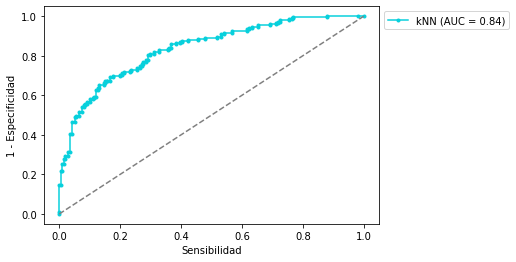

In [65]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*De momento, hemos conseguido el mejor desempeño en términos de área bajo la curva, aunque para la mayoría de las restantes métricas el valor es inferior a lo logrado empleando todas las características normalizadas. Sin embargo, preferiremos un AUC mayor y un menos costo computacional y en general por tener menos características.*

##### Caso 5A-III: Umbral 0.05

In [66]:
#Incrementar a 0.5 el umbral para feature importance
selected_features = []
for i in range(len(Xy_final_norm.columns)-1):
  print(Xy_final_norm.columns[i], importance[i])
  if(importance[i]>=0.05):
    selected_features.append(Xy_final_norm.columns[i])

selected_features

acousticness 0.0827752103594632
danceability 0.0820035438333552
duration_ms 0.08306296620125322
energy 0.08853872356698815
instrumentalness 0.10840802613566794
key 0.058921863088478535
liveness 0.06011737381100644
loudness 0.10599009673674926
mode 0.019297242289906404
speechiness 0.0893795973374009
tempo 0.06856241298771434
time_signature 0.014085893005880108
valence 0.07500578556152433
artist 0.06385126508461195


['acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'key',
 'liveness',
 'loudness',
 'speechiness',
 'tempo',
 'valence',
 'artist']

In [67]:
X = np.asarray(Xy_final_norm[selected_features])
y = np.asarray(Xy_final_norm['target'])

In [68]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [69]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=20, p=2,
                     weights='distance')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 20, 'weights': 'distance'}
Best score:  0.6938313887115187


accuracy 0.746268656716418
recall 0.6157635467980296
especificity 0.8793969849246231
precision 0.8389261744966443
npv 0.691699604743083
f1 0.7102272727272727
auc 0.7475802658613263


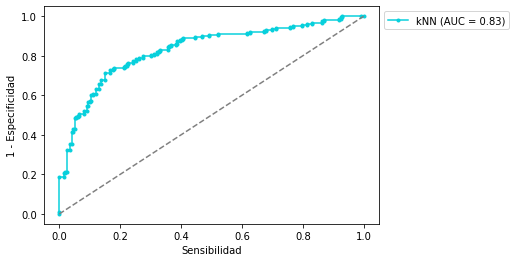

In [70]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*La incorporación de nuevas características, ha disminuido el desempeño del modelo.*

##### Caso 5A-IV: Umbral 0.08

*Dado que con umbral de 0.07 se logró la mejor performance, se prueba si al emplear un umbral de 0.08 que reduzca un poco más la cantidad de características, se obtiene un desempeño comparable.*

In [71]:
selected_features = []
for i in range(len(Xy_final_norm.columns)-1):
  print(Xy_final_norm.columns[i], importance[i])
  if(importance[i]>=0.08):
    selected_features.append(Xy_final_norm.columns[i])

selected_features

acousticness 0.0827752103594632
danceability 0.0820035438333552
duration_ms 0.08306296620125322
energy 0.08853872356698815
instrumentalness 0.10840802613566794
key 0.058921863088478535
liveness 0.06011737381100644
loudness 0.10599009673674926
mode 0.019297242289906404
speechiness 0.0893795973374009
tempo 0.06856241298771434
time_signature 0.014085893005880108
valence 0.07500578556152433
artist 0.06385126508461195


['acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'loudness',
 'speechiness']

In [72]:
X = np.asarray(Xy_final_norm[selected_features])
y = np.asarray(Xy_final_norm['target'])

In [73]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [74]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=29, p=2,
                     weights='distance')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 29, 'weights': 'distance'}
Best score:  0.711882510013351


accuracy 0.746268656716418
recall 0.645320197044335
especificity 0.8492462311557789
precision 0.8136645962732919
npv 0.7012448132780082
f1 0.7197802197802199
auc 0.7472832141000569


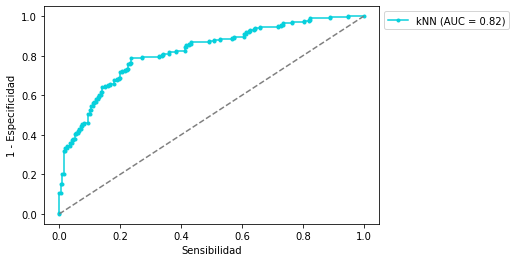

In [75]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Con un umbral de 0.08 y un total de siete atributos se logra una performance equivalente a la lograda empleando todos los atributos. La disminución del umbral a 0.07 y en consecuencia la incorporación de una octava característica, sin embargo, incrementa el poder predictivo sin grandes cambios en el costo computacional.*

#### Caso 5B: Recursive feature elimination

*Se prueba eliminación recursiva de características como otro método de selección de atributos*

##### Caso 5B-I: N° atributos =3

In [76]:
# load data
a = Xy_final_norm.values
X = a[:,:-1]
y = a[:,-1:]
# feature extraction
model = LogisticRegression(solver='lbfgs')
rfe = RFE(model, 3)
fit = rfe.fit(X,y)
print("Num Features: %d" % fit.n_features_)
print("Selected Features: %s" % fit.support_)
print("Feature Ranking: %s" % fit.ranking_)

selected_features = []

for i in range(len(fit.support_)):
  if(fit.support_[i]==True):
    selected_features.append(Xy_final_norm.columns[i])

print('\n Selected features:', selected_features)




/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Num Features: 3
Selected Features: [False  True  True False False False False False False  True False False
 False False]
Feature Ranking: [ 3  1  1 12  4  9  7  2  8  1  6 10  5 11]

 Selected features: ['danceability', 'duration_ms', 'speechiness']


In [77]:
X = np.asarray(Xy_final_norm[selected_features])
y = np.asarray(Xy_final_norm['target'])

In [78]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [79]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=25, p=2,
                     weights='uniform')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'uniform'}
Best score:  0.6608656953232329


accuracy 0.6442786069651741
recall 0.645320197044335
especificity 0.6432160804020101
precision 0.6485148514851485
npv 0.64
f1 0.6469135802469135
auc 0.6442681387231725


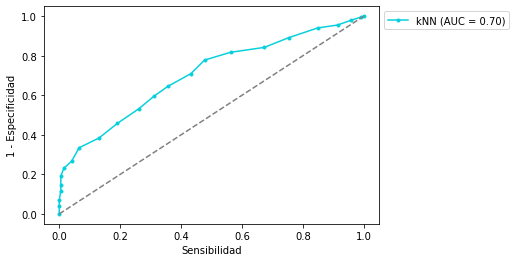

In [80]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Como conclusión más importante, podemos notar que las características empleadas con este método difieren de las dos características seleccionadas con feature importance y un umbral de 0.09; y que además, esta selección provoca una caída importante en el desempeño del modelo.*

##### Caso 5B-II: N° atributos =5

In [82]:
a = Xy_final_norm.values
X = a[:,:-1]
y = a[:,-1:]
# feature extraction
model = LogisticRegression(solver='lbfgs')
rfe = RFE(model, 5)
fit = rfe.fit(X,y)
print("Num Features: %d" % fit.n_features_)
print("Selected Features: %s" % fit.support_)
print("Feature Ranking: %s" % fit.ranking_)

selected_features = []

for i in range(len(fit.support_)):
  if(fit.support_[i]==True):
    selected_features.append(Xy_final_norm.columns[i])

print('\n Selected features:', selected_features)




/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Num Features: 5
Selected Features: [ True  True  True False False False False  True False  True False False
 False False]
Feature Ranking: [ 1  1  1 10  2  7  5  1  6  1  4  8  3  9]

 Selected features: ['acousticness', 'danceability', 'duration_ms', 'loudness', 'speechiness']


In [83]:
X = np.asarray(Xy_final_norm[selected_features])
y = np.asarray(Xy_final_norm['target'])

In [84]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [85]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=None, n_neighbors=32, p=2,
                     weights='distance')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'euclidean', 'n_neighbors': 32, 'weights': 'distance'}
Best score:  0.6963197306553666


accuracy 0.7338308457711443
recall 0.7192118226600985
especificity 0.7487437185929648
precision 0.7448979591836735
npv 0.7233009708737864
f1 0.7318295739348372
auc 0.7339777706265317


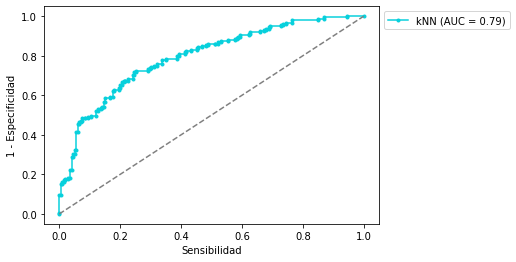

In [86]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*La incorporación de dos características más mejora el desempeño del modelo, que aún se encuentra por debajo del alcanzado utilizando feature importance como método de selección de atributos.*

##### Caso 5B-III: N° atributos = 7

In [89]:
a = Xy_final_norm.values
X = a[:,:-1]
y = a[:,-1:]
# feature extraction
model = LogisticRegression(solver='lbfgs')
rfe = RFE(model, 7)
fit = rfe.fit(X,y)
print("Num Features: %d" % fit.n_features_)
print("Selected Features: %s" % fit.support_)
print("Feature Ranking: %s" % fit.ranking_)

selected_features = []

for i in range(len(fit.support_)):
  if(fit.support_[i]==True):
    selected_features.append(Xy_final_norm.columns[i])

print('\n Selected features:', selected_features)




Num Features: 7
Selected Features: [ True  True  True False  True False False  True False  True False False
  True False]
Feature Ranking: [1 1 1 8 1 5 3 1 4 1 2 6 1 7]

 Selected features: ['acousticness', 'danceability', 'duration_ms', 'instrumentalness', 'loudness', 'speechiness', 'valence']


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [90]:
X = np.asarray(Xy_final_norm[selected_features])
y = np.asarray(Xy_final_norm['target'])

In [91]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [92]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=13, p=2,
                     weights='distance')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 13, 'weights': 'distance'}
Best score:  0.7118515508600839


accuracy 0.7437810945273632
recall 0.6551724137931034
especificity 0.8341708542713567
precision 0.8012048192771084
npv 0.7033898305084746
f1 0.7208672086720866
auc 0.7446716340322301


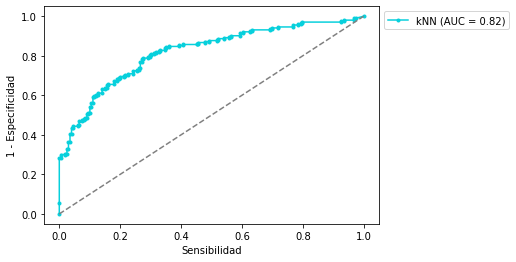

In [93]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*El incremento en el número de atributos provoca un aumento en la performance del modelo*

#### Caso 5C: PCA 



*Se recurre a un método de reducción de dimensionalidad sobre características normalizadas* 

#### Caso 5C-I: dos componentes principales

In [95]:
a = Xy_final_norm.values
X = a[:,:-1]
y = a[:,-1:]
pca = PCA(n_components=2)
fit = pca.fit(X)

print("Varianza explicada: %s" % fit.explained_variance_ratio_)
print(fit.components_)

#Componentes principales
X = pca.fit_transform(X)
X

Varianza explicada: [0.30340494 0.15407295]
[[-0.07674075  0.02785968  0.01107396  0.06157381  0.00748459  0.22978497
   0.01242     0.02409148 -0.96605428  0.01485509  0.02613901  0.00761975
   0.03747197 -0.01421   ]
 [ 0.54092564 -0.18635574  0.05884227 -0.43408136  0.42150034 -0.23578123
  -0.05681157 -0.22684255 -0.15283923 -0.05530262 -0.04598217 -0.039439
  -0.40304301  0.01760265]]


array([[-0.43707996, -0.0034141 ],
       [-0.47126693,  0.07817383],
       [-0.45792844,  0.07445892],
       ...,
       [-0.45264801, -0.24288652],
       [-0.42377929, -0.03975259],
       [-0.26169789, -0.36007954]])

In [96]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [97]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=None, n_neighbors=14, p=2,
                     weights='uniform')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'euclidean', 'n_neighbors': 14, 'weights': 'uniform'}
Best score:  0.5650026121785569


accuracy 0.5796019900497512
recall 0.4975369458128079
especificity 0.6633165829145728
precision 0.6011904761904762
npv 0.5641025641025641
f1 0.5444743935309974
auc 0.5804267643636903


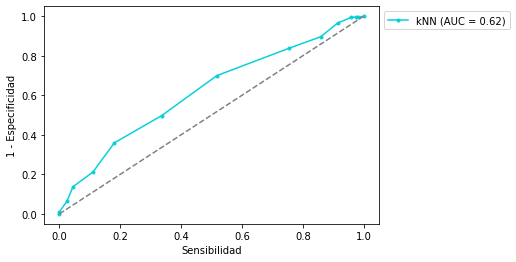

In [98]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

#### Caso 5C-II: tres componentes principales

In [99]:
a = Xy_final_norm.values
X = a[:,:-1]
y = a[:,-1:]
pca = PCA(n_components=3)
fit = pca.fit(X)

print("Varianza explicada: %s" % fit.explained_variance_ratio_)
print(fit.components_)

#Componentes principales
X = pca.fit_transform(X)
X

Varianza explicada: [0.30340494 0.15407295 0.12468889]
[[-0.07674075  0.02785968  0.01107394  0.0615738   0.00748459  0.22978497
   0.01242     0.02409148 -0.96605428  0.01485509  0.02613901  0.00761975
   0.03747197 -0.01421   ]
 [ 0.54092563 -0.18635573  0.05884195 -0.43408141  0.42150038 -0.23578123
  -0.05681156 -0.22684249 -0.15283924 -0.05530265 -0.04598218 -0.03943906
  -0.40304301  0.01760265]
 [ 0.10316606 -0.07863387  0.02187133 -0.0899479   0.1605433   0.93873011
   0.01912602 -0.05754937  0.20087472 -0.01971729  0.00401281 -0.01085159
  -0.1480754   0.03374584]]


array([[-0.43707996, -0.00341418, -0.22053417],
       [-0.47126693,  0.07817386, -0.31231057],
       [-0.45792844,  0.07445879, -0.20420546],
       ...,
       [-0.45264801, -0.24288651, -0.44022805],
       [-0.42377929, -0.03975266, -0.2621962 ],
       [-0.26169789, -0.36007945,  0.3425542 ]])

In [100]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [101]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                     weights='uniform')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'uniform'}
Best score:  0.5612952535748147


accuracy 0.582089552238806
recall 0.4630541871921182
especificity 0.7035175879396985
precision 0.6143790849673203
npv 0.5622489959839357
f1 0.5280898876404494
auc 0.5832858875659084


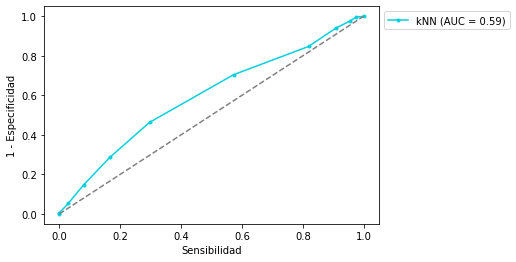

In [102]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

#### Caso 5C-III: cinco componentes principales

In [103]:
a = Xy_final_norm.values
X = a[:,:-1]
y = a[:,-1:]
pca = PCA(n_components=5)
fit = pca.fit(X)

print("Varianza explicada: %s" % fit.explained_variance_ratio_)
print(fit.components_)

#Componentes principales
X = pca.fit_transform(X)
X

Varianza explicada: [0.30340494 0.15407295 0.12468889 0.10420052 0.09126366]
[[-7.67407466e-02  2.78596757e-02  1.10739446e-02  6.15738032e-02
   7.48458763e-03  2.29784973e-01  1.24200024e-02  2.40914847e-02
  -9.66054278e-01  1.48550920e-02  2.61390054e-02  7.61974742e-03
   3.74719745e-02 -1.42099953e-02]
 [ 5.40925627e-01 -1.86355729e-01  5.88419622e-02 -4.34081419e-01
   4.21500379e-01 -2.35781233e-01 -5.68115594e-02 -2.26842471e-01
  -1.52839236e-01 -5.53026515e-02 -4.59821791e-02 -3.94390463e-02
  -4.03043008e-01  1.76026469e-02]
 [ 1.03166063e-01 -7.86338732e-02  2.18713266e-02 -8.99479011e-02
   1.60543305e-01  9.38730111e-01  1.91260175e-02 -5.75493688e-02
   2.00874715e-01 -1.97172940e-02  4.01280570e-03 -1.08515894e-02
  -1.48075405e-01  3.37458421e-02]
 [-1.22623759e-01 -2.73850533e-02  2.05833464e-02  4.39278001e-02
   1.21985562e-01  3.64922446e-03  2.13234243e-02  2.24047224e-03
   2.36583088e-02 -4.11005713e-04  3.53869454e-03  6.89465653e-03
  -1.27600159e-01 -9.74476

array([[-0.43707996, -0.00341418, -0.22053415,  0.18326893, -0.05073555],
       [-0.47126693,  0.07817388, -0.3123105 ,  0.28397726, -0.27305349],
       [-0.45792844,  0.07445881, -0.2042054 ,  0.18961031, -0.08916883],
       ...,
       [-0.45264801, -0.24288651, -0.44022805, -0.17521184,  0.23965142],
       [-0.42377929, -0.03975265, -0.26219614, -0.32266441,  0.67831775],
       [-0.26169789, -0.36007947,  0.34255412,  0.43461512,  0.10608578]])

In [104]:
X_train, X_test, y_train, y_test = stratified_split(X,y,0.20)

In [105]:
#Búsqueda de los mejores hiperparámetros para knn

parameters = {'n_neighbors':np.arange(1, int(np.sqrt(len(X_train))),1), 'weights': ('uniform', 'distance'), 'metric': ('euclidean', 'manhattan', 'minkowski'), 'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute')}

knn = KNeighborsClassifier()
clf_knn = GridSearchCV(knn, parameters, return_train_score=True)
clf_knn.fit(X_train, y_train.ravel())

best_knn = clf_knn.best_estimator_

print('Mejor estimador: ', best_knn)
print('Mejores parámetros: ', clf_knn.best_params_)
print('Best score: ', clf_knn.best_score_)



Mejor estimador:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=22, p=2,
                     weights='distance')
Mejores parámetros:  {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 22, 'weights': 'distance'}
Best score:  0.5743542114123178


accuracy 0.6268656716417911
recall 0.645320197044335
especificity 0.6080402010050251
precision 0.6267942583732058
npv 0.6269430051813472
f1 0.6359223300970874
auc 0.6266801990246801


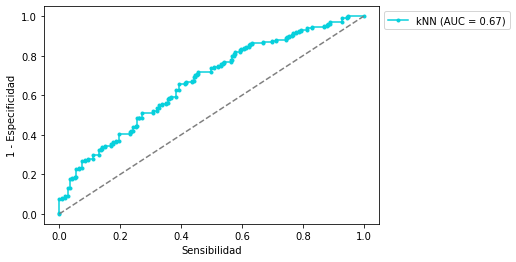

In [106]:
y_prob  = best_knn.predict_proba(X_test)[:, 1]
y_pred = best_knn.predict(X_test)

metricas = get_classification_metrics(y_test, y_pred)
for m in metricas:
  print(m, metricas[m])
plot_ROC(y_test, y_prob)

*Con el método de componentes principales para reducir la dimensionalidad, los resultados fueron inferiores a los obtenidos previamente.*

### Caso 6: K-Fold sobre mejores características seleccionadas e hiperparámetros óptimos obtenidos con Grid Search

* Ocho características normalizadas (feature importance, umbral 0.09): acousticness, danceability, duration_ms, energy, instrumentalness, loudness, speechiness, valence
* Sin eliminación de outliers
* Mejor estimador:  KNeighborsClassifier(algorithm='auto',metric='manhattan', n_neighbors=22, weights='distance')


In [112]:
#Dataset normalizado
Xy_final_norm #dataset normalizado

selected_features = []
for i in range(len(Xy_final_norm.columns)-1):
  print(Xy_final_norm.columns[i], importance[i])
  if(importance[i]>=0.07):
    selected_features.append(Xy_final_norm.columns[i])

print('\nCaracterísticas seleccionadas: ', selected_features)

X = np.asarray(Xy_final_norm[selected_features])
y = np.asarray(Xy_final_norm['target'])

acousticness 0.0827752103594632
danceability 0.0820035438333552
duration_ms 0.08306296620125322
energy 0.08853872356698815
instrumentalness 0.10840802613566794
key 0.058921863088478535
liveness 0.06011737381100644
loudness 0.10599009673674926
mode 0.019297242289906404
speechiness 0.0893795973374009
tempo 0.06856241298771434
time_signature 0.014085893005880108
valence 0.07500578556152433
artist 0.06385126508461195

Características seleccionadas:  ['acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'loudness', 'speechiness', 'valence']


*Dado que a lo largo de todo el trabajo práctico se ha empleado un tamaño del set de test del 20%, se consideran 5 particiones (5-fold), cada una de las cuales corresponderá a ese mismo porcentaje. Además, se pasarán al algoritmo los hiperparámetros obtenidos con grid search en el caso 5A-II* 


***** FOLD N° 1 *****

accuracy 0.7139303482587065
recall 0.5566502463054187
especificity 0.8743718592964824
precision 0.8188405797101449
npv 0.6590909090909091
f1 0.6627565982404692
auc 0.7155110528009505


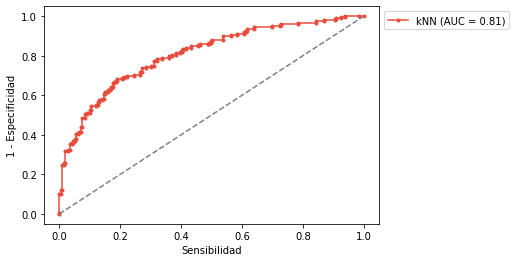


***** FOLD N° 2 *****

accuracy 0.7213930348258707
recall 0.5862068965517241
especificity 0.8592964824120602
precision 0.8095238095238095
npv 0.6705882352941176
f1 0.68
auc 0.7227516894818923


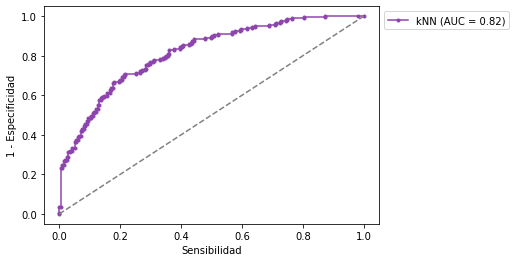


***** FOLD N° 3 *****

accuracy 0.6791044776119403
recall 0.5517241379310345
especificity 0.8090452261306532
precision 0.7466666666666667
npv 0.6388888888888888
f1 0.6345609065155807
auc 0.6803846820308439


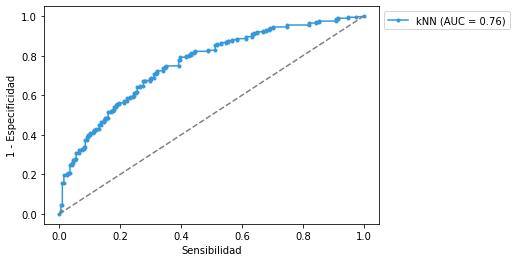


***** FOLD N° 4 *****

accuracy 0.7014925373134329
recall 0.5615763546798029
especificity 0.8442211055276382
precision 0.7862068965517242
npv 0.6536964980544747
f1 0.6551724137931034
auc 0.7028987301037206


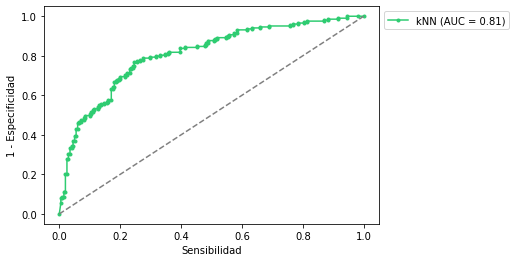


***** FOLD N° 5 *****

accuracy 0.7082294264339152
recall 0.5763546798029556
especificity 0.8434343434343434
precision 0.7905405405405406
npv 0.6600790513833992
f1 0.6666666666666665
auc 0.7098945116186495


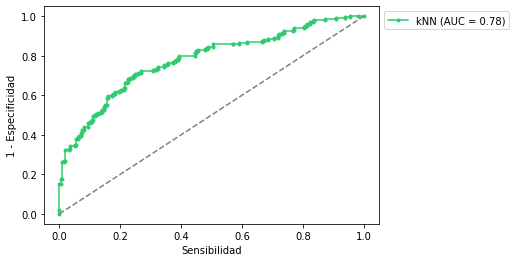

In [118]:
#Datos de cantidad de particiones
nro_splits = 5
n_fold = 1
ROC_colors = ['#E74C3C', '#8E44AD', '#3498DB', '#2ECC71', '#2ECC71']

skf = StratifiedKFold(n_splits=nro_splits, shuffle=True)

knn = KNeighborsClassifier(algorithm='auto',metric='manhattan', n_neighbors=22, weights='distance') 

#Datos de la partición
for train_index, test_index in skf.split(X,y): 
    
    X_train = X[train_index]
    y_train = y[train_index]
    X_test = X[test_index]
    y_test = y[test_index]
    
    knn.fit(X_train, y_train.ravel())

    y_prob  = knn.predict_proba(X_test)[:, 1]
    y_pred = knn.predict(X_test)

    metricas = get_classification_metrics(y_test, y_pred)
    print('\n***** FOLD N° %d *****\n' %(n_fold))
    for m in metricas:
      print(m, metricas[m])
      
    plot_ROC(y_test, y_prob, ROC_colors[n_fold-1])
    plt.show()
    n_fold += 1
 

*Notamos que, si bien no se alcanza el AUC de 0.84 logrado con la partición realizada empleando la función stratified_split definida al principio de esta notebook (con un random_state) fijo, en los cinco experimentos realizados en la validación curzada de K particiones se logran algoritmos con buen desempeño y en el rango de AUC de [0.76-0.82]*